# Experimento 2

Link do Datasets: https://botometer.osome.iu.edu/bot-repository/datasets.html

## Objetivos

• Validar métricas da vizinhança no processo de classificação.

• Avaliar o desempenho de diferentes algoritmos para os mesmos dados.
        

## Composição dos Dados de Treino/Teste

Nesse teste, utilizaremos os dados dos seguintes datasets: E13, TWT, INT, TFP e FSF.
O dataframe usado para o treino de diversos modelos de machine learning é composto de 50% de contas bots e 50% de contas legítimas.
Os dados que serão usados para teste seguem exatamente a mesma composição explicada anteriormente.

Relativo ao dataset de treino, ele utiliza 75% dos dados do dataset de bots, já o dataset de teste é composto por 25%.
A proporção se mantém a igual para os dados referentes as contas genuínas. 

# Escolha das features

A escolha dos dados relevantes foi feita considerando o que foi encontrado nos datasets e nos artigos mencionados no documento escrito

### Libs que serão utilizadas para a realização dos testes:

Para fazer a visualização da árvore de decisão é necessário instalar a lib graphviz para isso use o comando acima. Além disso, instale o graphviz em seu sistema operacional

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
from datetime import datetime
from sklearn.model_selection import train_test_split
from sklearn.svm import LinearSVC 
from sklearn.metrics import accuracy_score
from sklearn.dummy import DummyClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.model_selection import cross_validate
from sklearn.model_selection import StratifiedKFold
from math import sqrt
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer

Para melhorar a visualização dos dataframes:

In [2]:
def json_to_dataset(nome_arq):
    f = open(nome_arq)
    dataset = pd.read_json(f)
    dataset = pd.json_normalize(dataset.user)
    return dataset

In [3]:
def json_to_dataset2(nome_arq):
    f = open(nome_arq)
    dataset = pd.read_json(f)
    return dataset

In [4]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

Para a obtenção dos usuários que possuem dados da vizinhança, usaremos:

In [5]:
def get_users_with_no_neighborhood(dataset, dataset_friends, dataset_followers):
    merge_source_dataset_users_x_friends = pd.merge(dataset, dataset_friends, how='left', left_on='id',
                                             right_on= 'source_id',indicator=True)
    
    merge_target_dataset_users_x_friends = pd.merge(dataset,dataset_friends,how='left', left_on='id',
                                             right_on= 'target_id',indicator=True)
    
    merge_source_dataset_users_x_followers = pd.merge(dataset,dataset_followers,how='left', left_on='id',
                                             right_on= 'source_id',indicator=True)
    
    merge_target_dataset_users_x_followers = pd.merge(dataset,dataset_followers,how='left', left_on='id',
                                             right_on= 'target_id',indicator=True)
    
    users_no_followers_no_friends = pd.concat([merge_source_dataset_users_x_friends, 
                                               merge_target_dataset_users_x_friends,
                                               merge_source_dataset_users_x_followers, 
                                               merge_target_dataset_users_x_followers])
    
    users_no_followers_no_friends = users_no_followers_no_friends[users_no_followers_no_friends._merge=='left_only']

    users_no_followers_no_friends.drop_duplicates(subset=['id'],inplace=True)
    
    del users_no_followers_no_friends['_merge']
    
    
    return users_no_followers_no_friends

In [6]:
def get_users_with_neighborhood(dataset, dataset_friends, dataset_followers):
    merge_source_dataset_users_x_friends = pd.merge(dataset, dataset_friends, how='inner', left_on='id',
                                             right_on= 'source_id',indicator=True)
    
    merge_target_dataset_users_x_friends = pd.merge(dataset,dataset_friends,how='inner', left_on='id',
                                             right_on= 'target_id',indicator=True)
    
    merge_source_dataset_users_x_followers = pd.merge(dataset,dataset_followers,how='inner', left_on='id',
                                             right_on= 'source_id',indicator=True)
    
    merge_target_dataset_users_x_followers = pd.merge(dataset,dataset_followers,how='inner', left_on='id',
                                             right_on= 'target_id',indicator=True)
    
    users_with_neighborhood = pd.concat([merge_source_dataset_users_x_friends, 
                                               merge_target_dataset_users_x_friends,
                                               merge_source_dataset_users_x_followers, 
                                               merge_target_dataset_users_x_followers])
    
    uusers_with_neighborhood = users_with_neighborhood[users_with_neighborhood._merge=='both']

    users_with_neighborhood.drop_duplicates(subset=['id'],keep='first',inplace=True)
    
    return users_with_neighborhood

### E13

In [7]:
e13_dataset = pd.read_csv('./datasets/E13.csv/users.csv')
e13_dataset.shape

(1481, 34)

In [8]:
e13_followers_dataset = pd.read_csv('./datasets/followers_e13.csv')
e13_followers_dataset.shape

(4102, 2)

In [9]:
e13_friends_dataset = pd.read_csv('./datasets/friends_e13.csv')
e13_friends_dataset.shape

(4102, 2)

In [10]:
e13_dataset['is_bot'] = 0
e13_followers_dataset['dataset_name'] = 'E13'
e13_friends_dataset['dataset_name'] = 'E13'

### INT

In [11]:
int_dataset = pd.read_csv('./datasets/INT.csv/users.csv')
int_dataset.shape

(1337, 34)

In [12]:
int_followers_dataset = pd.read_csv('./datasets/followers_int.csv')
int_followers_dataset.shape

(158, 2)

In [13]:
int_friends_dataset = pd.read_csv('./datasets/friends_int.csv')
int_friends_dataset.shape

(158, 2)

In [14]:
int_dataset['is_bot'] = 1
int_followers_dataset['dataset_name'] = 'INT'
int_friends_dataset['dataset_name'] = 'INT'

### TFP

In [15]:
tfp_dataset = pd.read_csv('./datasets/TFP.csv/users.csv')
tfp_dataset.shape

(469, 34)

In [16]:
tfp_followers_dataset = pd.read_csv('./datasets/followers_tfp.csv')
tfp_followers_dataset.shape

(949, 2)

In [17]:
tfp_friends_dataset = pd.read_csv('./datasets/friends_tfp.csv')
tfp_friends_dataset.shape

(949, 2)

In [18]:
tfp_dataset['is_bot'] = 0
tfp_followers_dataset['dataset_name'] = 'TFP'
tfp_friends_dataset['dataset_name'] = 'TFP'

### TWT

In [19]:
twt_dataset = pd.read_csv('./datasets/TWT.csv/users.csv')
twt_dataset.shape

(845, 34)

In [20]:
twt_friends_dataset = pd.read_csv('./datasets/friends_twt.csv')
twt_friends_dataset.shape

(1, 2)

In [21]:
twt_followers_dataset = pd.read_csv('./datasets/followers_twt.csv')
twt_followers_dataset.shape

(1, 2)

In [22]:
twt_dataset['is_bot'] = 1
twt_friends_dataset['dataset_name'] = 'TWT'
twt_followers_dataset['dataset_name'] = 'TWT'

### FSF

In [23]:
fsf_dataset = pd.read_csv('./datasets/FSF.csv/users.csv')
fsf_dataset.shape

(1169, 34)

In [24]:
fsf_friends_dataset = pd.read_csv('./datasets/friends_fsf.csv')
fsf_friends_dataset.shape

(214, 2)

In [25]:
fsf_followers_dataset = pd.read_csv('./datasets/followers_fsf.csv')
fsf_followers_dataset.shape

(214, 2)

In [26]:
fsf_dataset['is_bot'] = 1
fsf_friends_dataset['dataset_name'] = 'FSF'
fsf_followers_dataset['dataset_name'] = 'FSF'

### Teste analisando a Vizinhança toda 

In [27]:
e13_followers_dataset_2 = pd.read_csv('./datasets/E13.csv/followers.csv')
e13_followers_dataset_2['dataset_name'] = 'E13'
e13_followers_dataset_2.shape

(1526944, 3)

In [28]:
e13_friends_dataset_2 = pd.read_csv('./datasets/E13.csv/friends.csv')
e13_friends_dataset_2['dataset_name'] = 'E13'
e13_friends_dataset_2.shape

(667225, 3)

In [29]:
int_followers_dataset_2 = pd.read_csv('./datasets/INT.csv/followers.csv')
int_followers_dataset_2['dataset_name'] = 'INT'
int_followers_dataset_2.shape

(23173, 3)

In [30]:
int_friends_dataset_2 = pd.read_csv('./datasets/INT.csv/friends.csv')
int_friends_dataset_2['dataset_name'] = 'INT'
int_friends_dataset_2.shape

(517485, 3)

In [31]:
tfp_followers_dataset_2 = pd.read_csv('./datasets/TFP.csv/followers.csv')
tfp_followers_dataset_2['dataset_name'] = 'TFP'
tfp_followers_dataset_2.shape

(258494, 3)

In [32]:
tfp_friends_dataset_2 = pd.read_csv('./datasets/TFP.csv/friends.csv')
tfp_friends_dataset_2['dataset_name'] = 'TFP'
tfp_friends_dataset_2.shape

(241710, 3)

In [33]:
twt_followers_dataset_2 = pd.read_csv('./datasets/TWT.csv/followers.csv')
twt_followers_dataset_2['dataset_name'] = 'TWT'
twt_followers_dataset_2.shape

(28588, 3)

In [34]:
twt_friends_dataset_2 = pd.read_csv('./datasets/TWT.csv/friends.csv')
twt_friends_dataset_2['dataset_name'] = 'TWT'
twt_friends_dataset_2.shape

(729839, 3)

In [35]:
fsf_followers_dataset_2 = pd.read_csv('./datasets/FSF.csv/followers.csv')
fsf_followers_dataset_2['dataset_name'] = 'FSF'
fsf_followers_dataset_2.shape

(11893, 3)

In [36]:
fsf_friends_dataset_2 = pd.read_csv('./datasets/FSF.csv/friends.csv')
fsf_friends_dataset_2['dataset_name'] = 'FSF'
fsf_friends_dataset_2.shape

(253026, 3)

In [37]:
dataset_friends_2 = pd.concat([twt_friends_dataset_2, fsf_friends_dataset_2, e13_friends_dataset_2,
                               int_friends_dataset_2, tfp_friends_dataset_2])
dataset_friends_2.shape

(2409285, 3)

In [38]:
dataset_friends_2.head(1)

,source_id,target_id,dataset_name
0,10935572,15913,TWT


In [39]:
dataset_followers_2 = pd.concat([twt_followers_dataset_2, fsf_followers_dataset_2, e13_followers_dataset_2,
                               int_followers_dataset_2, tfp_followers_dataset_2])
dataset_followers_2.shape

(1849092, 3)

In [40]:
dataset_followers_2.head(1)

,source_id,target_id,dataset_name
0,586,17656600,TWT


In [41]:
dataset_users_2 = pd.concat([twt_dataset, e13_dataset, tfp_dataset, int_dataset,fsf_dataset])
dataset_users_2.shape

(5301, 35)

In [42]:
dataset_users_2.head()

,id,name,screen_name,statuses_count,followers_count,friends_count,favourites_count,listed_count,created_at,url,lang,time_zone,location,default_profile,default_profile_image,geo_enabled,profile_image_url,profile_banner_url,profile_use_background_image,profile_background_image_url_https,profile_text_color,profile_image_url_https,profile_sidebar_border_color,profile_background_tile,profile_sidebar_fill_color,profile_background_image_url,profile_background_color,profile_link_color,utc_offset,protected,verified,description,updated,dataset,is_bot
0,80479674,YI YUAN,yi_twitts,29,19,255,1,0,Wed Oct 07 03:19:21 +0000 2009,http://www.jycondo.com,en,Eastern Time (US & Canada),toronto,NaN,NaN,1.0,http://a0.twimg.com/profile_images/1832741069/...,NaN,1.0,https://si0.twimg.com/images/themes/theme14/bg...,333333,https://si0.twimg.com/profile_images/183274106...,eeeeee,1.0,efefef,http://a0.twimg.com/images/themes/theme14/bg.gif,131516,009999,-18000.0,NaN,NaN,real estate sales,2015-02-14 09:55:39,TWT,1
1,82487179,Marcos Perez C,marcos_peca,1408,208,866,138,0,Wed Oct 14 23:40:17 +0000 2009,NaN,es,Mexico City,NaN,NaN,NaN,1.0,http://a0.twimg.com/profile_images/3106285928/...,https://si0.twimg.com/profile_banners/82487179...,1.0,https://si0.twimg.com/images/themes/theme6/bg.gif,333333,https://si0.twimg.com/profile_images/310628592...,86A4A6,NaN,A0C5C7,http://a0.twimg.com/images/themes/theme6/bg.gif,709397,FF3300,-21600.0,NaN,NaN,NaN,2015-02-14 09:55:39,TWT,1
2,105830531,curti lorenzo,curtilorenzo,39,59,962,8,0,Sun Jan 17 16:46:52 +0000 2010,http://www.valcavargna.com/,it,London,San Bartolomeo Val Cavargna CO,NaN,NaN,NaN,http://a0.twimg.com/profile_images/1743973394/...,NaN,1.0,https://si0.twimg.com/profile_background_image...,333333,https://si0.twimg.com/profile_images/174397339...,A8C7F7,NaN,C0DFEC,http://a0.twimg.com/profile_background_images/...,022330,0084B4,0.0,NaN,NaN,le corna del capro scappato dal gregge s'infil...,2015-02-14 09:55:39,TWT,1
3,114488344,ruben dario toscano,gatito2710,59,7,49,4,0,Mon Feb 15 15:49:58 +0000 2010,NaN,es,Lima,peru,1.0,NaN,NaN,http://a0.twimg.com/profile_images/1174713108/...,NaN,1.0,https://si0.twimg.com/images/themes/theme1/bg.png,333333,https://si0.twimg.com/profile_images/117471310...,C0DEED,NaN,DDEEF6,http://a0.twimg.com/images/themes/theme1/bg.png,C0DEED,0084B4,-18000.0,NaN,NaN,NaN,2015-02-14 09:55:39,TWT,1
4,123222267,Malek Khalaf,MalekKhalaf,987,60,521,61,1,Mon Mar 15 11:38:55 +0000 2010,http://www.facebook.com/Malek.AlBalawi,en,Riyadh,"31.975193,35.920294",NaN,NaN,1.0,http://a0.twimg.com/profile_images/2861541411/...,https://si0.twimg.com/profile_banners/12322226...,NaN,https://si0.twimg.com/profile_background_image...,DDE1E4,https://si0.twimg.com/profile_images/286154141...,000002,NaN,A9A09B,http://a0.twimg.com/profile_background_images/...,D9FBFC,C0C3CC,10800.0,NaN,NaN,"MA student at JU, Interested in Juventus,Italy...",2015-02-14 09:55:39,TWT,1


In [43]:
dataset_users_2.is_bot.value_counts()

1    3351
0    1950
Name: is_bot, dtype: int64

In [44]:
dataset_users_2.set_index('id')

,name,screen_name,statuses_count,followers_count,friends_count,favourites_count,listed_count,created_at,url,lang,time_zone,location,default_profile,default_profile_image,geo_enabled,profile_image_url,profile_banner_url,profile_use_background_image,profile_background_image_url_https,profile_text_color,profile_image_url_https,profile_sidebar_border_color,profile_background_tile,profile_sidebar_fill_color,profile_background_image_url,profile_background_color,profile_link_color,utc_offset,protected,verified,description,updated,dataset,is_bot
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
80479674,YI YUAN,yi_twitts,29,19,255,1,0,Wed Oct 07 03:19:21 +0000 2009,http://www.jycondo.com,en,Eastern Time (US & Canada),toronto,NaN,NaN,1.0,http://a0.twimg.com/profile_images/1832741069/...,NaN,1.0,https://si0.twimg.com/images/themes/theme14/bg...,333333,https://si0.twimg.com/profile_images/183274106...,eeeeee,1.0,efefef,http://a0.twimg.com/images/themes/theme14/bg.gif,131516,009999,-18000.0,NaN,NaN,real estate sales,2015-02-14 09:55:39,TWT,1
82487179,Marcos Perez C,marcos_peca,1408,208,866,138,0,Wed Oct 14 23:40:17 +0000 2009,NaN,es,Mexico City,NaN,NaN,NaN,1.0,http://a0.twimg.com/profile_images/3106285928/...,https://si0.twimg.com/profile_banners/82487179...,1.0,https://si0.twimg.com/images/themes/theme6/bg.gif,333333,https://si0.twimg.com/profile_images/310628592...,86A4A6,NaN,A0C5C7,http://a0.twimg.com/images/themes/theme6/bg.gif,709397,FF3300,-21600.0,NaN,NaN,NaN,2015-02-14 09:55:39,TWT,1
105830531,curti lorenzo,curtilorenzo,39,59,962,8,0,Sun Jan 17 16:46:52 +0000 2010,http://www.valcavargna.com/,it,London,San Bartolomeo Val Cavargna CO,NaN,NaN,NaN,http://a0.twimg.com/profile_images/1743973394/...,NaN,1.0,https://si0.twimg.com/profile_background_image...,333333,https://si0.twimg.com/profile_images/174397339...,A8C7F7,NaN,C0DFEC,http://a0.twimg.com/profile_background_images/...,022330,0084B4,0.0,NaN,NaN,le corna del capro scappato dal gregge s'infil...,2015-02-14 09:55:39,TWT,1
114488344,ruben dario toscano,gatito2710,59,7,49,4,0,Mon Feb 15 15:49:58 +0000 2010,NaN,es,Lima,peru,1.0,NaN,NaN,http://a0.twimg.com/profile_images/1174713108/...,NaN,1.0,https://si0.twimg.com/images/themes/theme1/bg.png,333333,https://si0.twimg.com/profile_images/117471310...,C0DEED,NaN,DDEEF6,http://a0.twimg.com/images/themes/theme1/bg.png,C0DEED,0084B4,-18000.0,NaN,NaN,NaN,2015-02-14 09:55:39,TWT,1
123222267,Malek Khalaf,MalekKhalaf,987,60,521,61,1,Mon Mar 15 11:38:55 +0000 2010,http://www.facebook.com/Malek.AlBalawi,en,Riyadh,"31.975193,35.920294",NaN,NaN,1.0,http://a0.twimg.com/profile_images/2861541411/...,https://si0.twimg.com/profile_banners/12322226...,NaN,https://si0.twimg.com/profile_background_image...,DDE1E4,https://si0.twimg.com/profile_images/286154141...,000002,NaN,A9A09B,http://a0.twimg.com/profile_background_images/...,D9FBFC,C0C3CC,10800.0,NaN,NaN,"MA student at JU, Interested in Juventus,Italy...",2015-02-14 09:55:39,TWT,1
144602443,ruthyohannadelarosa,ruthyohanna,286,141,1075,3,0,Sun May 16 19:51:50 +0000 2010,NaN,es,Caracas,Santo domingo,1.0,NaN,1.0,http://a0.twimg.com/profile_images/3065421059/...,NaN,1.0,https://si0.twimg.com/images/themes/theme1/bg.png,333333,https://si0.twimg.com/profile_images/306542105...,C0DEED,NaN,DDEEF6,http://a0.twimg.com/images/themes/theme1/bg.png,C0DEED,0084B4,-16200.0,NaN,NaN,Con Dios no necesito nada mas el es mi fortaleza,2015-02-14 09:55:39,TWT,1
212958140,Julieta Analia Perez,July_pz,45,16,342,0,1,Sun Nov 07 15:13:37 +0000 2010,NaN,es,NaN,Argentina,1.0,NaN,NaN,http://a0.twimg.com/profile_images/1493915242/...,NaN,1.0,https://si0.twimg.com/images/themes/theme1/bg.png,333333,https://si0.twimg.com/profile_images/149391524...,C0DEED,NaN,DDEEF6,http://a0.twimg.com/images/themes/theme1/bg.png,C0DEED,0084B4,NaN,NaN,NaN,NaN,2015-02-14 09:55:39,TWT,1
278082770,carlosjaviervega,bevega,72,14,287,0,0,Wed Apr 06 15:35:32 +0000 2011,NaN,es,NaN,NaN,1.0,NaN,NaN,http://a0.twimg.com/profile_images/1310287197/...,NaN,1.0,https://si0.twimg

dataset_followers_2.set_index('target_id')

dataset_friends_2.set_index('source_id')

In [45]:
def has_description(row):
    if row['description']:
        return 1
    else: 
        return 0

def has_url(row):
    if row['url']:
        return 1
    else:
        return 0

def num_list(row):
    return row['listed_count']

def is_geo_enabled(row):
    if row['geo_enabled']:
        return 1
    else:
        return 0

def statuses_count(row):
    return row['statuses_count']

def num_followers(row):
    return row['followers_count']

def num_friends(row):
    return row['friends_count']

def num_favourites(row):
    return row['favourites_count']

def has_twice_number_followers(row):
    if 2*row['followers_count'] >= row['friends_count']:
        return 1
    else:
        return 0
    
def has_50_friends_1_follower_ratio(row):
    if 50*row['followers_count'] <= row['friends_count']:
        return 1
    else:
        return 0

def has_100_friends_1_follower_ratio(row):
    if 100* row['followers_count'] <= row['friends_count']:
        return 1
    else: 
        return 0

def has_profile_image(row):
    if row['default_profile_image']:
        return 0
    else:
        return 1
    
def has_default_profile(row):
    if row['default_profile']:
        return 1
    else:
        return 0

def is_protected(row):
    if row['protected']:
        return 1
    else:
        return 0
    
def is_verified(row):
    if row['verified']:
        return 1
    else:
        return 0
    
def is_bot(row):
    if row['is_bot']:
        return 1
    else:
        return 0

In [46]:
def get_friends_id(user_id, dataset_friends, dataset_name):
    return dataset_friends.query('source_id == @user_id & dataset_name == @dataset_name')['target_id']

def get_followers_id(user_id, dataset_followers,dataset_name):
    return dataset_followers.query('target_id == @user_id & dataset_name == @dataset_name')['source_id']

In [47]:
def follow_back(user_id, user2_id, dataset_followers,dataset_name):
    user2_followers = get_followers_id(user2_id, dataset_followers, dataset_name)
    return (user2_followers == user_id).any()

In [48]:
def get_friends_that_follow_me_back(row, dataset_users,dataset_friends):
    friends = get_friends_id(row['id'],dataset_friends, row['dataset'])
    friends_that_follow_me_back = [follow_back(friend, row['id'],dataset_friends,row['dataset']) for friend in friends]
    friends_that_follow_me_back_ratio = (friends_that_follow_me_back.count(True)/row['friends_count']) if row['friends_count'] > 0 else 0
    return friends_that_follow_me_back_ratio

In [49]:
def get_followers_that_i_follow_back(row, dataset_users, dataset_followers):
    followers = get_followers_id(row['id'], dataset_followers, row['dataset'])
    followers_i_follow_back = [follow_back(row['id'], follower,dataset_followers,row['dataset']) for follower in followers ]
    followers_i_follow_back_ratio = (followers_i_follow_back.count(True)/row['followers_count']) if row['followers_count'] > 0 else 0
    return followers_i_follow_back_ratio

In [50]:
def get_binary_matrix_full_neighborhood(dataset_users,dataset_friends,dataset_followers):
    binary_full_matrix_train_neighborhood = get_binary_matrix(dataset_users)
    binary_full_matrix_train_neighborhood['followers_i_follow_back_ratio'] = dataset_users.apply(lambda x : get_followers_that_i_follow_back(x,dataset_users,dataset_followers), axis=1)
    binary_full_matrix_train_neighborhood['friends_that_follow_me_back_ratio'] = dataset_users.apply(lambda x : get_friends_that_follow_me_back(x,dataset_users,dataset_friends), axis=1)

    return binary_full_matrix_train_neighborhood

start_time = datetime.now()
binary_full_matrix_train_neighborhood = get_binary_matrix_full_neighborhood(dataset_users_2,
                                                                            dataset_friends_2,dataset_followers_2)

end_time = datetime.now()
print('Duration: {}'.format(end_time - start_time))

In [51]:
binary_full_matrix_train_neighborhood = pd.read_csv("dataset_com_vizinhança_final_final.csv")

In [52]:
binary_full_matrix_train_neighborhood.shape

(5301, 18)

In [53]:
binary_full_matrix_train_neighborhood.head()

,has_description,has_url,is_geo_enabled,has_twice_number_followers,has_default_profile,has_profile_image,has_100_friends_1_follower_ratio,has_50_friends_1_follower_ratio,is_protected,is_verified,num_favourites,num_list,num_followers,num_friends,statuses_count,followers_i_follow_back_ratio,friends_that_follow_me_back_ratio,is_bot
0,1,1,1,0,0,1,0,1,0,0,1,0,23,1360,29,0.347826,0.005882,1
1,0,0,1,0,0,1,0,0,0,0,138,0,234,1970,1408,0.790598,0.093909,1
2,1,1,0,0,0,1,0,0,0,0,8,0,77,1949,39,0.870130,0.034377,1
3,0,0,0,0,1,1,0,0,0,0,4,0,23,251,59,0.260870,0.023904,1
4,1,1,1,0,0,1,0,0,0,0,61,1,79,834,987,0.392405,0.037170,1


In [54]:
x = binary_full_matrix_train_neighborhood[['has_description','has_url','is_geo_enabled', 'has_twice_number_followers','has_default_profile','has_profile_image', 'has_100_friends_1_follower_ratio', 'has_50_friends_1_follower_ratio', 'is_protected', 'is_verified', 'num_favourites','num_list','num_followers','num_friends','statuses_count','followers_i_follow_back_ratio', 'friends_that_follow_me_back_ratio']]

In [55]:
x.head()

,has_description,has_url,is_geo_enabled,has_twice_number_followers,has_default_profile,has_profile_image,has_100_friends_1_follower_ratio,has_50_friends_1_follower_ratio,is_protected,is_verified,num_favourites,num_list,num_followers,num_friends,statuses_count,followers_i_follow_back_ratio,friends_that_follow_me_back_ratio
0,1,1,1,0,0,1,0,1,0,0,1,0,23,1360,29,0.347826,0.005882
1,0,0,1,0,0,1,0,0,0,0,138,0,234,1970,1408,0.790598,0.093909
2,1,1,0,0,0,1,0,0,0,0,8,0,77,1949,39,0.870130,0.034377
3,0,0,0,0,1,1,0,0,0,0,4,0,23,251,59,0.260870,0.023904
4,1,1,1,0,0,1,0,0,0,0,61,1,79,834,987,0.392405,0.037170


In [56]:
x.shape

(5301, 17)

In [57]:
y = binary_full_matrix_train_neighborhood['is_bot']

In [58]:
train_x, test_x, train_y, test_y = train_test_split(x,y,random_state=0, test_size = 0.3, stratify = y)
train_y.value_counts()

1    2345
0    1365
Name: is_bot, dtype: int64

In [59]:
def confusion_matrix_description(conf_matrix):    
    plt.figure(figsize= (10,8))
    sns.set(font_scale=2)
    sns.heatmap(conf_matrix, annot=True, fmt="d").set(xlabel="Prediction", ylabel="Real")
    true_negative, false_positive, false_negative, true_positive = conf_matrix.ravel()
    x = (true_positive + false_positive) * (true_positive + false_negative) * (true_negative + false_positive) * (true_negative + false_negative)
    mcc = np.around(((true_positive * true_negative) - (false_positive * false_negative)) / sqrt(x),decimals = 2) 
    
    print(f'Verdadeiro Negativo(Diz que não é bot e não é): {true_negative}, {np.around((true_negative/(true_negative+false_positive))*100,decimals=2)}% do total')
    print(f'Falso positivo(Diz que é bot, mas não é): {false_positive}, {np.around((false_positive/(true_negative+false_positive))*100,decimals=2)}% do total')
    print(f'Falso Negativo(Diz que não é bot, mas é ): {false_negative}, {np.around((false_negative/(true_positive+false_negative))*100,decimals=2)}% do total' )
    print(f'Verdadeiro Positivo(Diz que é bot e é ): {true_positive}, {np.around((true_positive/(true_positive+false_negative))*100,decimals=2)}% do total')
    print(f'MCC: {mcc}')

In [60]:
preprocessor = ColumnTransformer([("Scaler", StandardScaler(), [10,11,12,13,14])], remainder='passthrough')
modelRandomTree_with_neighborhood_features = Pipeline([('Preprocessor',preprocessor), 
                          ('Classifier', RandomForestClassifier(n_estimators= 100))])
modelRandomTree_with_neighborhood_features.fit(train_x, train_y)
predictions = modelRandomTree_with_neighborhood_features.predict(test_x)
score = np.around(accuracy_score(test_y, predictions)*100,decimals=2)
print(f'Acurácia do Random Tree Classifier com vizinhança é: {score}%')

Acurácia do Random Tree Classifier com vizinhança é: 99.25%


Verdadeiro Negativo(Diz que não é bot e não é): 580, 99.15% do total
Falso positivo(Diz que é bot, mas não é): 5, 0.85% do total
Falso Negativo(Diz que não é bot, mas é ): 7, 0.7% do total
Verdadeiro Positivo(Diz que é bot e é ): 999, 99.3% do total
MCC: 0.98


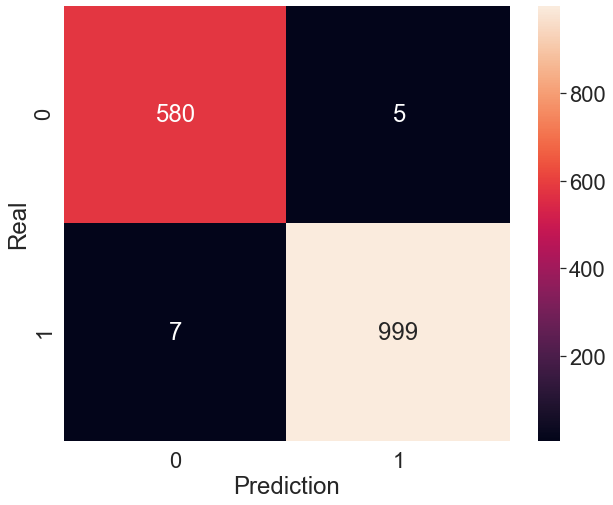

In [61]:
dt_confusion_matrix = confusion_matrix(test_y, predictions)
confusion_matrix_description(dt_confusion_matrix)

Até então, podemos extrair algumas informações valiosas referentes aos nossos dados. Contudo, na divisão dos dados de treino e de teste estamos fortemente dependente da seed que foi definida(random_state = 0). 
Por estarmos sempre utilizando o mesmo treino e o mesme teste, podemos acabar tendo um grupo de dados extramemente específicos que podem enviesando nosso algoritmo.

Portanto, será necessário aleatorizar o nossos treinos e testes a fim de mitigar as possíveis inconsistências, para isso utilizaremos o StratifiedKFold que definirá diferentes grupos randomicos de teste e treino, mantendo sempre a estratificação que foi explicada anteriormente.

### StratifiedKFold

Para facilitar a visualização dos dados referentes ao cross validate mostraremos o intervalo de acurácia para os diferentes grupos de treino/teste e a acurácia média:

In [62]:
def cross_validation_description(results, model):
    std_dev = results['test_score'].std()
    mean = results['test_score'].mean()
    mean_p = np.around(mean *100, decimals=2)
    min_interval = np.around((mean - 2 * std_dev)*100,decimals = 2)
    max_interval = np.around((mean + 2 * std_dev) *100, decimals = 2)
    print(f'Intervalo de Acurácia do {model} é: [{min_interval}%, {max_interval}%] ')
    print(f'Média de Acurácia: {mean_p}%')

Quanto as parâmetros, temos que n_splits representa a quantidade de grupos(5 grupos de 1365) que serão criados e shuffle = True presenta que os dados serão embaralhados.

In [63]:
cv = StratifiedKFold(n_splits = 5, shuffle = True)

##### Random Tree

In [64]:
results = cross_validate(modelRandomTree_with_neighborhood_features, x, y, cv = cv, return_train_score=False)
cross_validation_description(results,'modelRandomForest')

Intervalo de Acurácia do modelRandomForest é: [98.49%, 99.55%] 
Média de Acurácia: 99.02%


### TSNE

Para visualizar a distruibuição da nossas classes no espaço, utilizaremos o algoritmos TSNE que, resumidamente, tranforma dados de muitas dimensões em dados com dimensões reduzidas mantendo o máximo de informação que for possível. 

<AxesSubplot:>

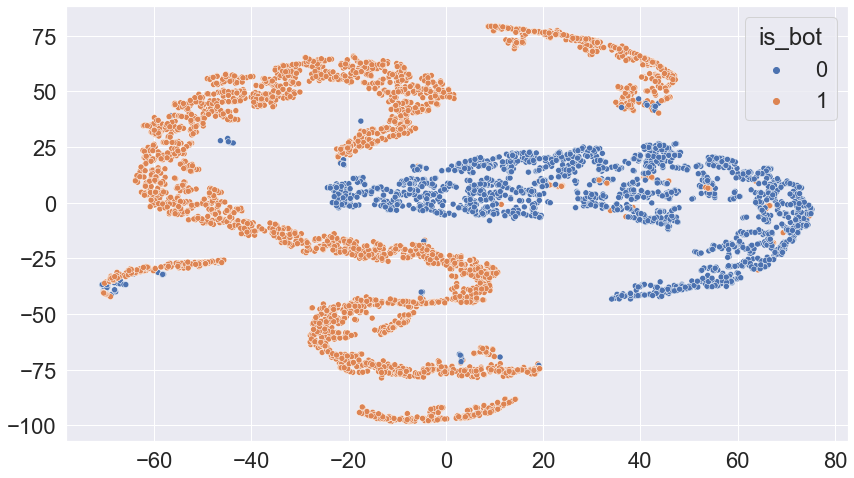

In [65]:
tsne = TSNE(n_components = 2)
tsne_dimensions = tsne.fit_transform(binary_full_matrix_train_neighborhood)
plt.figure(figsize=(14,8))
sns.scatterplot(x = tsne_dimensions[:,0] ,y = tsne_dimensions[:,1], hue = binary_full_matrix_train_neighborhood['is_bot'])

### Matriz de Correlação

In [66]:
binary_full_matrix_train_neighborhood.is_protected.value_counts()

0    5301
Name: is_protected, dtype: int64

In [67]:
binary_full_matrix_train_neighborhood.is_verified.value_counts()

0    5301
Name: is_verified, dtype: int64

In [68]:
del binary_full_matrix_train_neighborhood['is_protected']
del binary_full_matrix_train_neighborhood['is_verified']


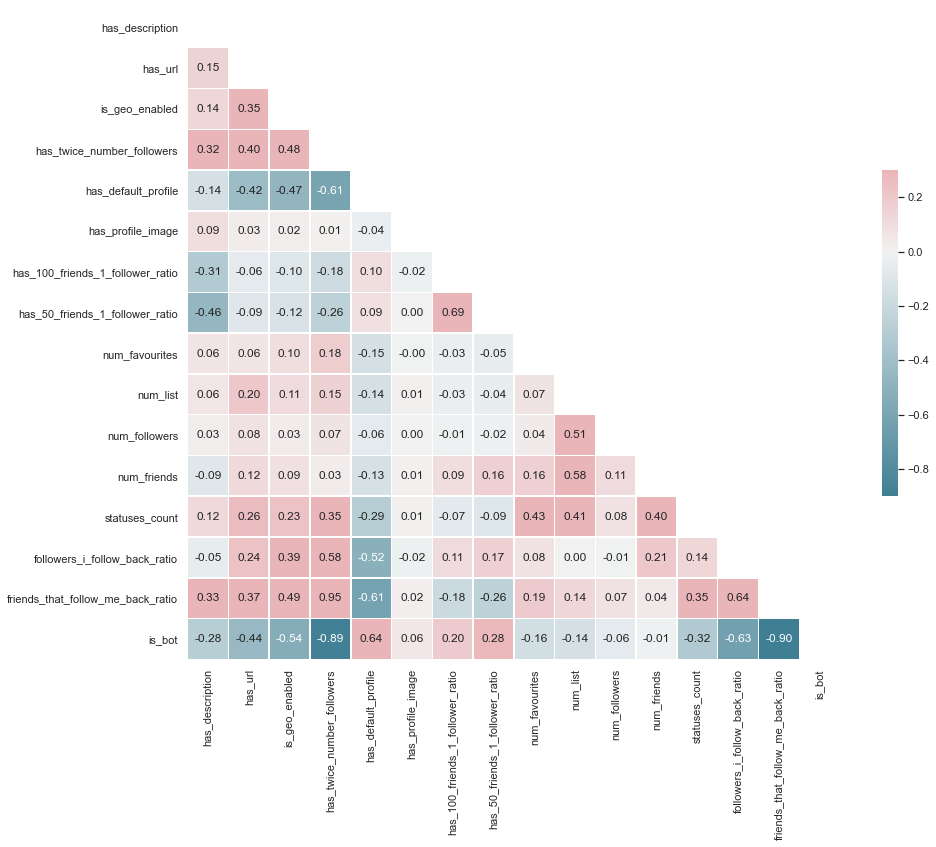

In [69]:
sns.set(style="white")

# Generate a mask for the upper triangle
mask = np.zeros_like(binary_full_matrix_train_neighborhood.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(15, 12))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
matrix_corr = sns.heatmap(binary_full_matrix_train_neighborhood.corr(), mask=mask,annot=True, cmap=cmap,fmt='.2f', vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})


In [70]:
figure = matrix_corr.get_figure()    
figure.savefig('matriz_correlacao_experimento_2.png', bbox_inches = "tight")